# Compact representations of celebrity face images using deep fully convolutional autoencoders

In [1]:
from glob import glob
import math, munch, pickle

import torch as th
import numpy as np

import skimage as ski

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (9, 8)

In [2]:
filenames = glob('CelebA/Img/img_align_celeba/*.jpg')
len(filenames)

202599

((218, 178, 3), dtype('uint8'), 0, 255)

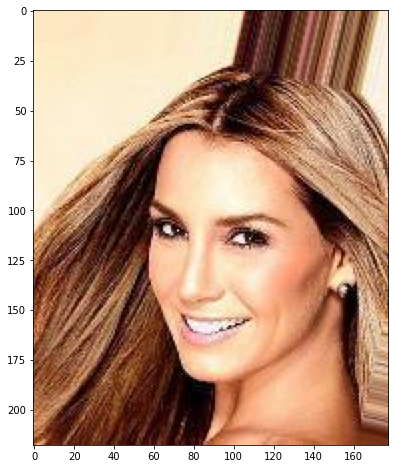

In [3]:
img = ski.io.imread(filenames[0])

plt.imshow(img);
img.shape, img.dtype, img.min(), img.max()

((218, 178, 3), dtype('float32'), 0.0, 1.0)

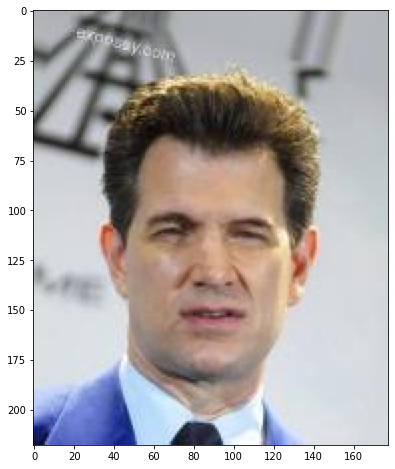

In [4]:
img = ski.img_as_float32(ski.io.imread(filenames[14]))

plt.imshow(img);
img.shape, img.dtype, img.min(), img.max()

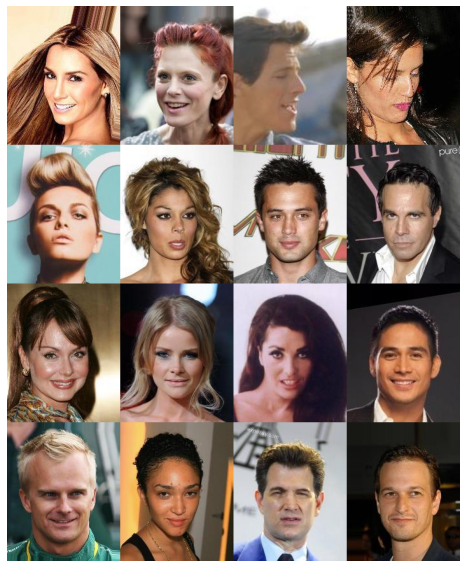

In [5]:
imgs = np.array([ski.img_as_float32(ski.io.imread(filename)) for filename in filenames[:16]])
montage = ski.util.montage(imgs, multichannel=True)

fig, ax = plt.subplots();
ax.imshow(montage);
ax.axis('off');
fig.tight_layout();

In [6]:
class ImageDataset(th.utils.data.Dataset):
    def __init__(self, filenames):
        self.filenames = list(filenames)
    
    def plot_montage(self, n=16):
        np_imgs = self[:n].permute(0, 2, 3, 1).numpy()
        montage = ski.util.montage(np_imgs, multichannel=True)
        fig, ax = plt.subplots()
        ax.imshow(montage)
        ax.axis('off')
        fig.tight_layout()
        
    def get(self, idx):
        np_img = ski.img_as_float32(ski.io.imread(self.filenames[idx]))
        th_img = th.as_tensor(np_img, dtype=th.float32).permute(2, 0, 1)
        return th_img
        
    def __getitem__(self, idx):
        if isinstance(idx, int):
            return self.get(idx)
        
        elif isinstance(idx, slice):
            start, stop, stride = idx.indices(len(self))
            return th.stack([self.get(i) for i in range(start, stop, stride)])
            
        else:
            raise TypeError(f'indices must be integers or slices, not {type(idx).__name__}')
    
    def __len__(self):
        return len(self.filenames)

In [7]:
nfiles = len(filenames)
train_frac, valid_frac, test_frac = 0.8, 0.1, 0.1
ntrain = int(nfiles * train_frac)
nvalid = int(nfiles * valid_frac)
ntest = nfiles - ntrain - nvalid

nfiles, ntrain + nvalid + ntest, ntrain, nvalid, ntest

(202599, 202599, 162079, 20259, 20261)

In [8]:
rng = np.random.RandomState(42)
rng.shuffle(filenames)

train_filenames = filenames[:ntrain]
valid_filenames = filenames[ntrain:(ntrain+nvalid)]
test_filenames = filenames[(ntrain+nvalid):]

len(train_filenames), len(valid_filenames), len(test_filenames)

(162079, 20259, 20261)

In [9]:
train_data = ImageDataset(train_filenames)
valid_data = ImageDataset(valid_filenames)
test_data = ImageDataset(test_filenames)

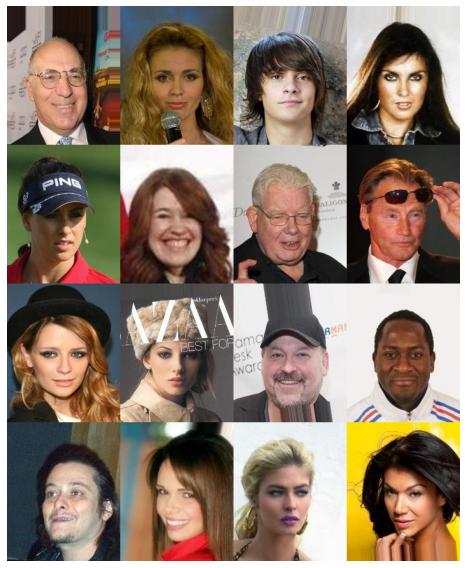

In [10]:
valid_data.plot_montage()

In [11]:
class EncodeBlock(th.nn.Module):
    def __init__(self, nchan, nfilt, kernel_size, stride, transfer):
        super().__init__()
        
        self.batch_norm = th.nn.BatchNorm2d(
            nchan, momentum=0.05)
        
        self.resid = th.nn.Conv2d(
            nchan, nfilt,
            kernel_size=1,
            padding=0,
            stride=stride)
        
        self.conv = th.nn.Conv2d(
            nchan, nfilt,
            kernel_size=kernel_size,
            padding=kernel_size // 2,
            stride=stride)
        
        self.transfer = transfer()
        
    def forward(self, imgs):
        assert imgs.ndim == 4
        
        norm_imgs = self.batch_norm(imgs)
        resid_out = self.resid(norm_imgs)
        conv_out = self.transfer(self.conv(norm_imgs))
        
        assert resid_out.shape == conv_out.shape
        return resid_out + conv_out

In [12]:
class DenseBlock(th.nn.Module):
    def __init__(self, ninput, nunit, transfer):
        super().__init__()
        
        self.batch_norm = th.nn.BatchNorm1d(
            ninput, momentum=0.05)
        
        self.hidden = th.nn.Linear(ninput, nunit)
        self.transfer = transfer()
        
    def forward(self, flat):
        assert flat.ndim == 2
        
        norm_flat = self.batch_norm(flat)
        hidden_out = self.transfer(self.hidden(norm_flat))
        
        return hidden_out

In [13]:
class Encoder(th.nn.Module):
    def __init__(self, nchan, height, width, conv_specs, ndense,
                 conv_transfer=th.nn.ReLU, dense_transfer=th.nn.Tanh):
        super().__init__()
        
        self.nchan, self.height, self.width = nchan, height, width
        self.output_shapes = [(nchan, height, width)]
        self.conv_specs = conv_specs
        self.ndense = ndense
        
        convs = []
        layer_in, layer_out = None, self.nchan
        for nfilt, kernel_size, stride in self.conv_specs:
            layer_in, layer_out = layer_out, nfilt
        
            convs.append(
                EncodeBlock(
                    layer_in, nfilt,
                    kernel_size=kernel_size,
                    stride=stride,
                    transfer=conv_transfer))
            
            height = math.ceil(height / stride)
            width = math.ceil(width / stride)
            self.output_shapes.append((layer_out, height, width))
            
        self.conv = th.nn.Sequential(*convs)
        
        if self.ndense is None:
            self.dense = lambda x: x
        else:
            self.dense = DenseBlock(
                layer_out * height * width, self.ndense,
                transfer=dense_transfer)
        
    def forward(self, imgs):
        assert isinstance(imgs, th.Tensor)                                                          
        assert imgs.ndim == 4                                                                 
        assert imgs.shape[1] == self.nchan                                                          
        assert imgs.shape[2] == self.height                                                         
        assert imgs.shape[3] == self.width                                                          
        batch_size = imgs.shape[0]                                                                  
                                                                                                    
        conv_out = self.conv(imgs)                                                        
        assert conv_out.ndim == 4                                                        
        assert conv_out.shape[0] == batch_size                                                 
        assert conv_out.shape[1] == self.output_shapes[-1][0] # nfilt
        assert conv_out.shape[2] == self.output_shapes[-1][1] # height
        assert conv_out.shape[3] == self.output_shapes[-1][2] # width
                                                                                                    
        conv_flat = conv_out.reshape(batch_size, -1)
        assert conv_flat.ndim == 2
        assert conv_flat.shape[0] == batch_size
        
        codes = self.dense(conv_flat)
        assert codes.ndim == 2
        assert codes.shape[0] == batch_size
        
        return codes

In [14]:
class DecodeBlock(th.nn.Module):
    def __init__(self, nchan, nfilt, kernel_size, stride, transfer, output_shape):
        super().__init__()
        self.output_shape = output_shape
        
        self.batch_norm = th.nn.BatchNorm2d(
            nchan, momentum=0.05)
        
        #self.resid = th.nn.ConvTranspose2d(
        #    nchan, nfilt,
        #    kernel_size=1,
        #    padding=0,
        #    stride=stride)
        self.resid = th.nn.Sequential(
            th.nn.Conv2d(nchan, nfilt, kernel_size=1),
            th.nn.Upsample(size=self.output_shape, mode='nearest'),
        )
        
        self.conv = th.nn.ConvTranspose2d(
            nchan, nfilt,
            kernel_size=kernel_size,
            padding=kernel_size // 2,
            stride=stride)
        
        self.transfer = transfer()
        
    def forward(self, imgs):
        assert imgs.ndim == 4
        
        norm_imgs = self.batch_norm(imgs)
        #resid_out = self.resid(norm_imgs, self.output_shape)
        resid_out = self.resid(norm_imgs)
        conv_out = self.transfer(self.conv(norm_imgs, self.output_shape))

        assert resid_out.shape == conv_out.shape
        return resid_out + conv_out

In [15]:
class Decoder(th.nn.Module):
    def __init__(self, output_shapes, conv_specs, ndense,
                 conv_transfer=th.nn.ReLU, dense_transfer=th.nn.Tanh):
        super().__init__()
        
        self.output_shapes = output_shapes
        self.conv_specs = conv_specs
        self.ndense = ndense
        
        if self.ndense is None:
            self.dense = lambda x: x
        else:
            first_shape = self.output_shapes[0]
            dense_out = first_shape[0] * first_shape[1] * first_shape[2]
            self.dense = DenseBlock(self.ndense, dense_out, dense_transfer)
        
        deconvs = []
        layer_in, layer_out = None, output_shapes[0][0]
        for i, (nfilt, kernel_size, stride) in enumerate(self.conv_specs):
            layer_in, layer_out = layer_out, nfilt
        
            deconvs.append(
                DecodeBlock(
                    layer_in, nfilt,
                    kernel_size=kernel_size,
                    stride=stride,
                    transfer=conv_transfer,
                    output_shape=self.output_shapes[i+1][1:]))

        self.deconv = th.nn.Sequential(*deconvs)
        
        nchan, _height, _width = self.output_shapes[-1]
        self.readout = th.nn.Sequential(                                                            
            th.nn.BatchNorm2d(layer_out, momentum=0.05),                                                           
            th.nn.Conv2d(layer_out, nchan, kernel_size=1, padding=0))
    
    def forward(self, codes):
        assert isinstance(codes, th.Tensor)
        assert codes.ndim == 2
        batch_size = codes.shape[0]
        
        dense_out = self.dense(codes)
        assert dense_out.ndim == 2
        assert dense_out.shape[0] == batch_size
                                                                                                    
        dense_unflat = dense_out.reshape((batch_size,) + self.output_shapes[0])
        assert dense_unflat.ndim == 4
        assert dense_unflat.shape[0] == batch_size
        assert dense_unflat.shape[1] == self.output_shapes[0][0] # nfilt
        assert dense_unflat.shape[2] == self.output_shapes[0][1] # height
        assert dense_unflat.shape[3] == self.output_shapes[0][2] # width

        deconv_out = self.deconv(dense_unflat)                                                   
        assert deconv_out.ndim == 4
        assert deconv_out.shape[0] == batch_size
        assert deconv_out.shape[2] == self.output_shapes[-1][1] # height
        assert deconv_out.shape[3] == self.output_shapes[-1][2] # width
                                                                                                    
        imgs = self.readout(deconv_out)
        assert imgs.ndim == 4
        assert imgs.shape[0] == batch_size
        assert imgs.shape[1] == self.output_shapes[-1][0] # nchan
        assert imgs.shape[2] == self.output_shapes[-1][1] # height
        assert imgs.shape[3] == self.output_shapes[-1][2] # width
                                                                                                    
        return imgs

In [16]:
class Autoencoder(th.nn.Module):
    def __init__(self, nchan, height, width, conv_specs, ndense,
                 conv_transfer=th.nn.ReLU, dense_transfer=th.nn.Tanh):
        super().__init__()

        assert nchan > 0
        assert height > 0
        assert width > 0
        self.nchan, self.height, self.width = nchan, height, width

        assert ndense is None or ndense > 0
        self.ndense = ndense
        
        assert isinstance(conv_specs, tuple)
        self.conv_specs = conv_specs

        assert issubclass(conv_transfer, th.nn.Module)
        assert issubclass(dense_transfer, th.nn.Module)
                                                                                            
        self.encoder = Encoder(
            nchan=self.nchan,
            height=self.height,
            width=self.width,
            conv_specs=self.conv_specs,
            ndense=self.ndense,
            conv_transfer=conv_transfer,
            dense_transfer=dense_transfer)

        rev_conv_specs = tuple(reversed(self.conv_specs))
        rev_output_shapes = tuple(reversed(self.encoder.output_shapes))
                                                                                                    
        self.decoder = Decoder(
            output_shapes=rev_output_shapes,
            conv_specs=rev_conv_specs,
            ndense=self.ndense,
            conv_transfer=conv_transfer,
            dense_transfer=dense_transfer)
                                                                                                    
        self.sigmoid = th.nn.Sigmoid()                                                              
                                                                                                    
    def forward(self, imgs):                                                                        
        return self.decoder(self.encoder(imgs))                                                     
                                                                                                    
    def recon(self, imgs):                                                                          
        return self.sigmoid(self(imgs)).detach()

In [17]:
from torch.cuda import amp
import torch.cuda.amp

In [18]:
def train(model, train_data, valid_data, max_epochs=100, stop_epochs=20,
          learning_rate=0.00175, learning_rate_decay=0.996, clip_norm=6,
          batch_size=256, load_workers=20, use_gpu=True):

        train_loader = th.utils.data.DataLoader(
            train_data,
            batch_size=batch_size,
            pin_memory=use_gpu,
            num_workers=load_workers,
            drop_last=True,
            shuffle=True)

        valid_loader = th.utils.data.DataLoader(
            valid_data,
            batch_size=batch_size,
            pin_memory=use_gpu,
            num_workers=load_workers,
            shuffle=False)

        if use_gpu:
            model.cuda()
        
        # AMP
        scaler = amp.GradScaler()

        loss_func = th.nn.BCEWithLogitsLoss(reduction='mean')

        train_losses = []
        valid_losses = []

        best_train_loss = float('inf')
        best_valid_loss = float('inf')
        best_epoch = 0
        best_state = None

        # all parameters with `requires_grad` set
        parameters = list(filter(lambda param: param.requires_grad, model.parameters()))
        
        # initialize the optimizer
        optimizer = th.optim.Adam(parameters, lr=learning_rate)
        
        # exponential learning rate decay
        lr_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, learning_rate_decay)
        
        for epoch in range(max_epochs):                                                                                                    
            # enter training mode
            model.train()

            # training pass
            epoch_train_losses = []
            for i, imgs in enumerate(train_loader):
                optimizer.zero_grad()

                if use_gpu:
                    imgs = imgs.cuda()

                # AMP
                with amp.autocast():
                    recons = model(imgs)
                    loss = loss_func(recons, imgs)

                loss_f = loss.item()
                epoch_train_losses.append(loss_f)

                # AMP
                #loss.backward()
                scaler.scale(loss).backward()
                
                # AMP
                scaler.unscale_(optimizer)

                if clip_norm is not None:
                    th.nn.utils.clip_grad_norm_(parameters, clip_norm)

                # AMP
                #optimizer.step()
                scaler.step(optimizer)
                scaler.update()

            train_losses.append(np.mean(epoch_train_losses))
            
            # back to evaluation mode
            model.eval()

            # validation loss
            with th.no_grad():
                epoch_valid_losses = []
                for i, imgs in enumerate(valid_loader):
                    if use_gpu:
                        imgs = imgs.cuda()

                    # AMP
                    with amp.autocast():
                        recons = model(imgs)
                        loss = loss_func(recons, imgs)

                    loss_f = loss.item()
                    epoch_valid_losses.append(loss_f)

            valid_losses.append(np.mean(epoch_valid_losses))
            
            if valid_losses[-1] < best_valid_loss:
                best_train_loss = train_losses[-1]
                best_valid_loss = valid_losses[-1]
                best_epoch = epoch
                best_state = model.state_dict()

            print('epoch:', epoch)
            print('learning rate:', next(iter(optimizer.param_groups))['lr'])
            print('train loss:', train_losses[-1])
            print('valid loss:', valid_losses[-1])
            print('best epoch:', best_epoch)
            print('=======')
                
            if (best_epoch + stop_epochs) <= epoch:
                print(f'terminating after {stop_epochs} of no improvement')
                break

            lr_scheduler.step()

        if best_state is None:
            raise RuntimeError('best state not set!')

        model.load_state_dict(best_state)

        if use_gpu:
            model.cpu()

        return munch.munchify({
            'train_losses': train_losses,
            'valid_losses': valid_losses,
            'best_train_loss': best_train_loss,
            'best_valid_loss': best_valid_loss,
            'best_epoch': best_epoch,
        })

In [19]:
first_image = train_data[0]

autoencoder = Autoencoder(
    nchan=first_image.shape[0],
    height=first_image.shape[1],
    width=first_image.shape[2],
    #conv_specs=((24, 19, 2), (32, 15, 2), (40, 11, 2), (48, 7, 2), (56, 3, 2))
    conv_specs=((16, 19, 2), (24, 15, 2), (32, 11, 2), (40, 7, 2), (48, 3, 2)),
    #conv_specs=((8, 11, 2), (16, 9, 2), (24, 7, 2), (32, 5, 2), (40, 3, 2)),
    #conv_specs=((16, 19, 2), (32, 15, 2), (48, 11, 2), (64, 7, 2), (80, 3, 2)),
    ndense=None)

autoencoder

Autoencoder(
  (encoder): Encoder(
    (conv): Sequential(
      (0): EncodeBlock(
        (batch_norm): BatchNorm2d(3, eps=1e-05, momentum=0.05, affine=True, track_running_stats=True)
        (resid): Conv2d(3, 16, kernel_size=(1, 1), stride=(2, 2))
        (conv): Conv2d(3, 16, kernel_size=(19, 19), stride=(2, 2), padding=(9, 9))
        (transfer): ReLU()
      )
      (1): EncodeBlock(
        (batch_norm): BatchNorm2d(16, eps=1e-05, momentum=0.05, affine=True, track_running_stats=True)
        (resid): Conv2d(16, 24, kernel_size=(1, 1), stride=(2, 2))
        (conv): Conv2d(16, 24, kernel_size=(15, 15), stride=(2, 2), padding=(7, 7))
        (transfer): ReLU()
      )
      (2): EncodeBlock(
        (batch_norm): BatchNorm2d(24, eps=1e-05, momentum=0.05, affine=True, track_running_stats=True)
        (resid): Conv2d(24, 32, kernel_size=(1, 1), stride=(2, 2))
        (conv): Conv2d(24, 32, kernel_size=(11, 11), stride=(2, 2), padding=(5, 5))
        (transfer): ReLU()
      )
     

In [20]:
sum(p.nelement() for p in autoencoder.parameters())

870169

In [21]:
first_image.shape, first_image.shape[0] * first_image.shape[1] * first_image.shape[2]

(torch.Size([3, 218, 178]), 116412)

In [22]:
autoencoder.eval()
autoencoder.encoder(first_image[None, ...]).shape

torch.Size([1, 2016])

In [23]:
autoencoder.encoder.output_shapes

[(3, 218, 178),
 (16, 109, 89),
 (24, 55, 45),
 (32, 28, 23),
 (40, 14, 12),
 (48, 7, 6)]

In [24]:
autoencoder(first_image[None, ...]).shape, first_image.shape

(torch.Size([1, 3, 218, 178]), torch.Size([3, 218, 178]))

In [25]:
recon = autoencoder.recon(first_image[None, ...])
recon.min(), recon.max()

(tensor(0.3988), tensor(0.6082))

In [26]:
train_result = train(autoencoder, train_data, valid_data, max_epochs=80)

epoch: 0
learning rate: 0.00175
train loss: 0.49750694331211315
valid loss: 0.4857018493115902
best epoch: 0
epoch: 1
learning rate: 0.001743
train loss: 0.4822722857503153
valid loss: 0.48035861290991305
best epoch: 1
epoch: 2
learning rate: 0.001736028
train loss: 0.47926364337663513
valid loss: 0.4786754701286554
best epoch: 2
epoch: 3
learning rate: 0.0017290838879999999
train loss: 0.47778714475285194
valid loss: 0.47741642519831656
best epoch: 3
epoch: 4
learning rate: 0.0017221675524479998
train loss: 0.4770586173304638
valid loss: 0.4770479314029217
best epoch: 4
epoch: 5
learning rate: 0.0017152788822382078
train loss: 0.47659501762940043
valid loss: 0.4768393997102976
best epoch: 5
epoch: 6
learning rate: 0.001708417766709255
train loss: 0.47625599017640424
valid loss: 0.47589092180132864
best epoch: 6
epoch: 7
learning rate: 0.001701584095642418
train loss: 0.47599293689403865
valid loss: 0.47660538032650945
best epoch: 6
epoch: 8
learning rate: 0.0016947777592598483
train l

epoch: 63
learning rate: 0.0013594911018298401
train loss: 0.47425584977648644
valid loss: 0.47446100451052187
best epoch: 63
epoch: 64
learning rate: 0.0013540531374225209
train loss: 0.4742475947215094
valid loss: 0.4744378373026848
best epoch: 64
epoch: 65
learning rate: 0.0013486369248728307
train loss: 0.4742575284994044
valid loss: 0.47447381503880026
best epoch: 64
epoch: 66
learning rate: 0.0013432423771733394
train loss: 0.4742514242493146
valid loss: 0.4751545049250126
best epoch: 64
epoch: 67
learning rate: 0.001337869407664646
train loss: 0.47423747153643747
valid loss: 0.47485406175255773
best epoch: 64
epoch: 68
learning rate: 0.0013325179300339874
train loss: 0.4742418939562582
valid loss: 0.4748596493154764
best epoch: 64
epoch: 69
learning rate: 0.0013271878583138515
train loss: 0.4742348059941242
valid loss: 0.47437102608382703
best epoch: 69
epoch: 70
learning rate: 0.0013218791068805961
train loss: 0.4742458316292996
valid loss: 0.4747792448848486
best epoch: 69
epo

In [27]:
with open('autoencoder5.pkl', mode='wb') as fh:                                                  
    th.save(autoencoder.state_dict(), fh)

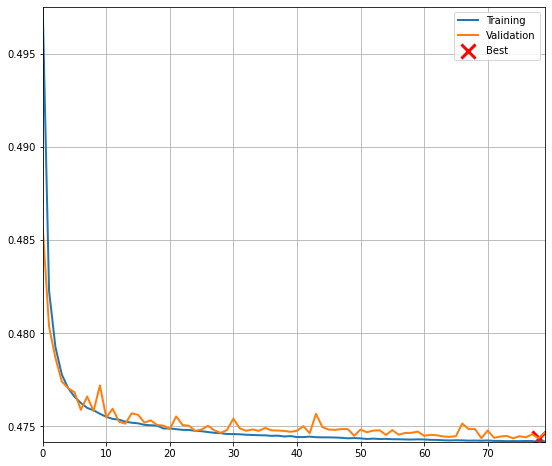

In [28]:
fig_loss = plt.figure()
ax_loss = fig_loss.add_subplot(1, 1, 1)
ax_loss.plot(train_result.train_losses, linewidth=2, label='Training')
ax_loss.plot(train_result.valid_losses, linewidth=2, label='Validation')
ax_loss.scatter(
    (train_result.best_epoch,), (train_result.best_valid_loss,),
    linewidth=3, s=200, marker='x', color='red', label='Best')
ax_loss.legend()
ax_loss.autoscale(tight=True)
ax_loss.grid();

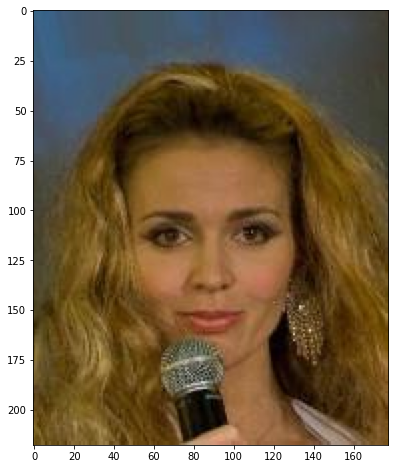

In [29]:
first_image = valid_data[1]
plt.imshow(first_image.permute(1, 2, 0));

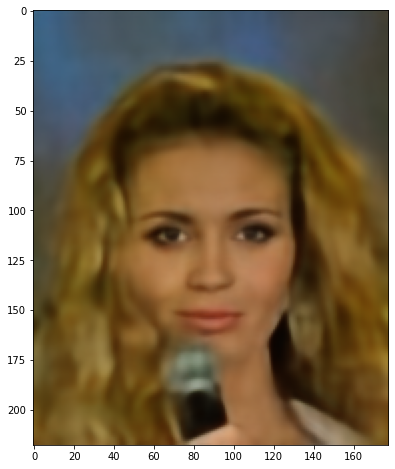

In [30]:
recon = autoencoder.recon(first_image[None, ...])

plt.imshow(recon.squeeze(0).permute(1, 2, 0));

In [31]:
def latent_interpolation(data, nrow=4, ninterp=6):
    fig = plt.figure()
    axs = []

    for row in range(nrow):
        img_idx = row
        first_image = data[img_idx]
        second_image = data[img_idx + nrow]

        first_latent = autoencoder.encoder(first_image[None, ...])
        second_latent = autoencoder.encoder(second_image[None, ...])

        for col in range(ninterp):
            interp_frac = col / float(ninterp - 1)
            interp_latent = interp_frac * first_latent + (1.0 - interp_frac) * second_latent

            decoded = th.sigmoid(autoencoder.decoder(interp_latent)).detach()
            np_decoded = decoded.squeeze(0).permute(1, 2, 0).numpy()

            ax = fig.add_subplot(nrow, ninterp, row*ninterp + col + 1)
            ax.imshow(np_decoded)
            ax.axis('off')
            axs.append(ax)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)

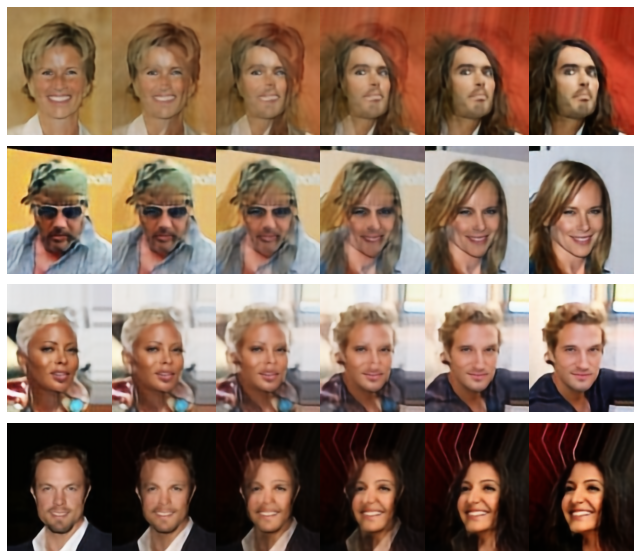

In [32]:
latent_interpolation(train_data);

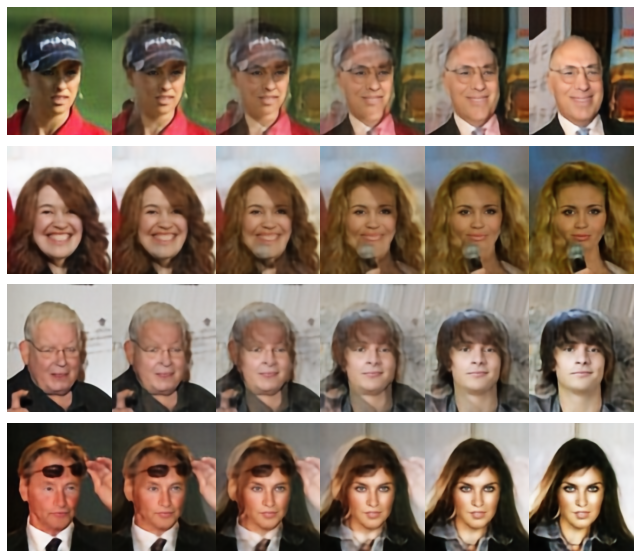

In [33]:
latent_interpolation(valid_data);

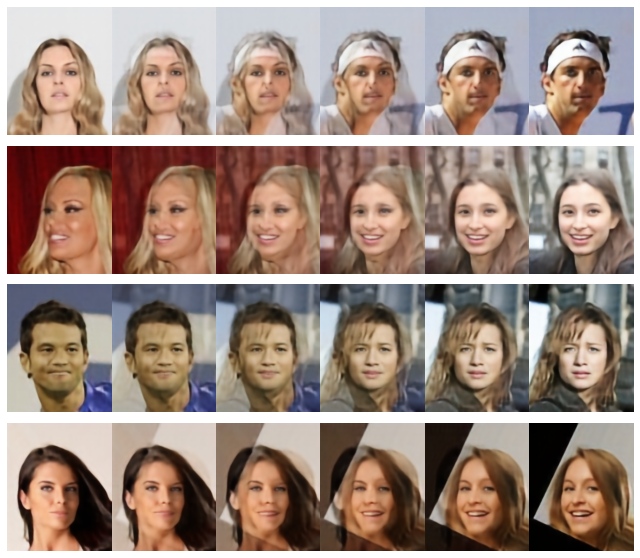

In [34]:
rng.shuffle(test_data.filenames)
latent_interpolation(test_data);

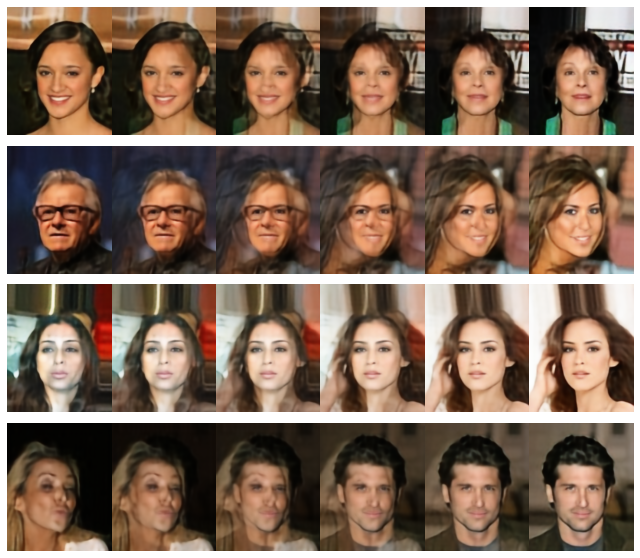

In [35]:
rng.shuffle(test_data.filenames)
latent_interpolation(test_data);

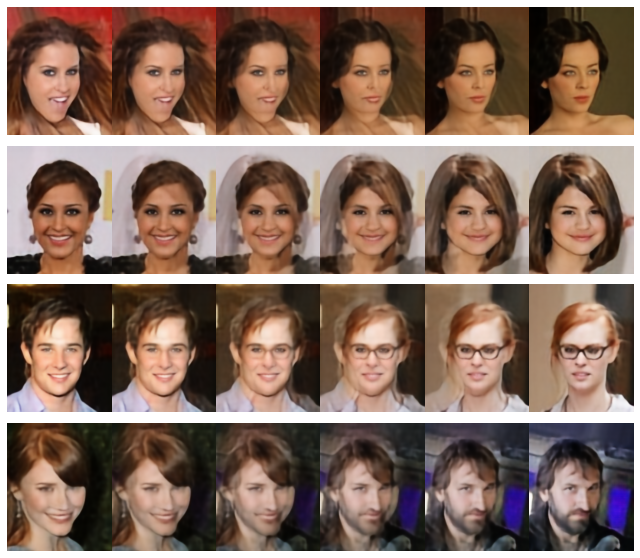

In [36]:
rng.shuffle(test_data.filenames)
latent_interpolation(test_data);

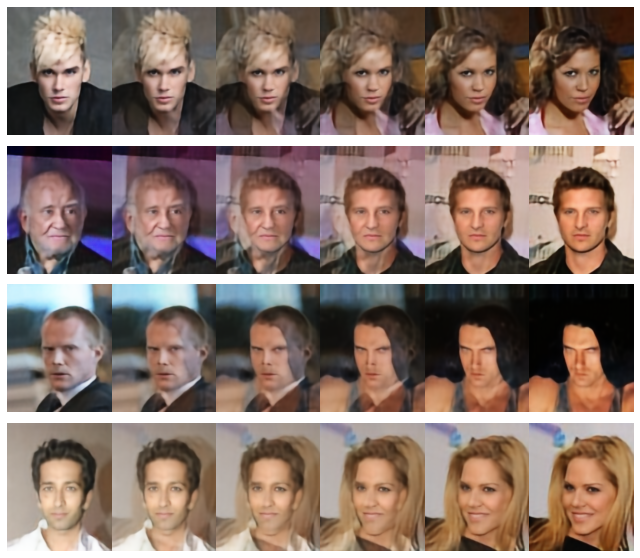

In [37]:
rng.shuffle(test_data.filenames)
latent_interpolation(test_data);

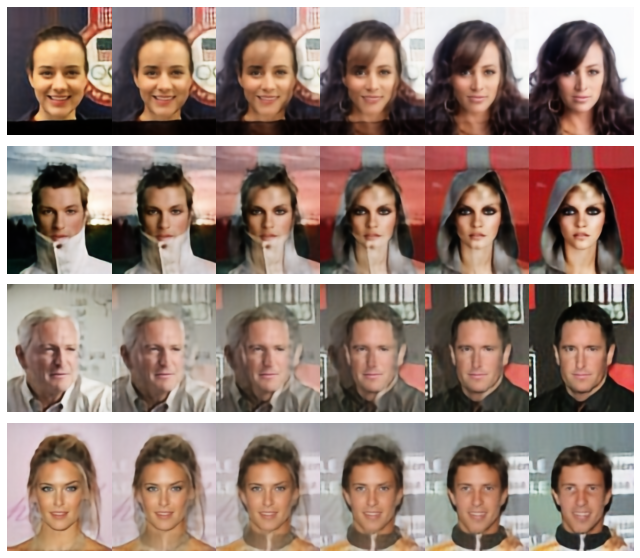

In [38]:
rng.shuffle(test_data.filenames)
latent_interpolation(test_data);

In [39]:
def plot_conv_weights(weights):
    weights = weights.detach().reshape(-1, weights.shape[2], weights.shape[3]).numpy()
    
    nfilt = weights.shape[0]
    
    fig = plt.figure()
    
    print(weights.shape)
    montage = ski.util.montage(weights, multichannel=False)
    
    ax = fig.add_subplot(1, 1, 1)
    implt = ax.imshow(np.abs(montage), cmap=plt.cm.hot)
    
    plt.colorbar(implt)
    
    ax.axis('off')
    fig.tight_layout()

(48, 19, 19)


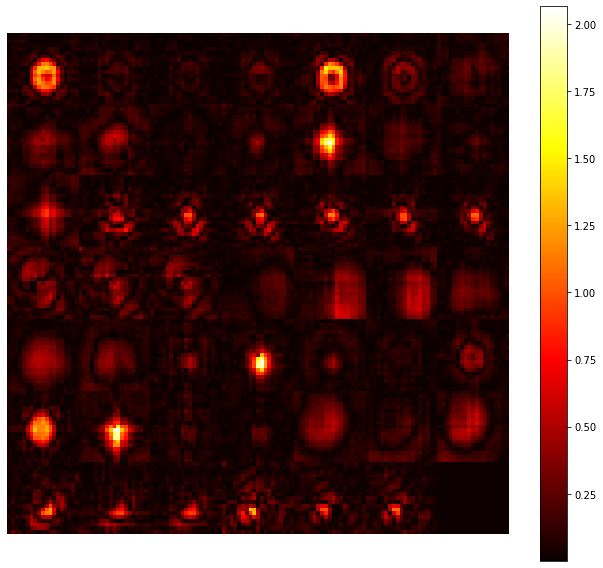

In [40]:
plot_conv_weights(autoencoder.encoder.conv[0].conv.weight)

(384, 15, 15)


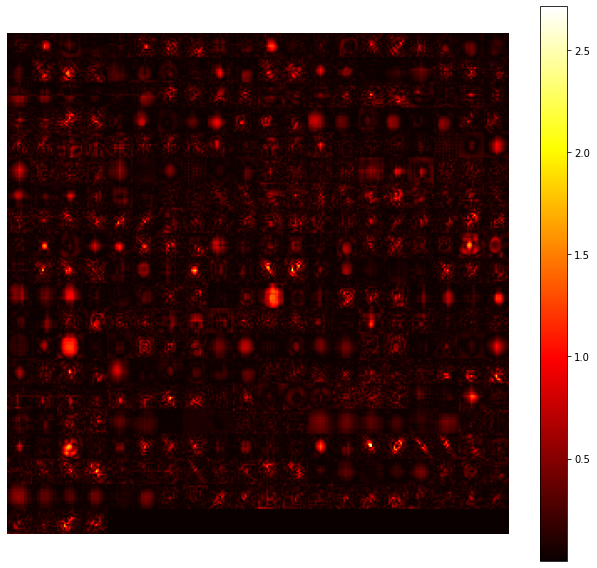

In [41]:
plot_conv_weights(autoencoder.encoder.conv[1].conv.weight)

(768, 15, 15)


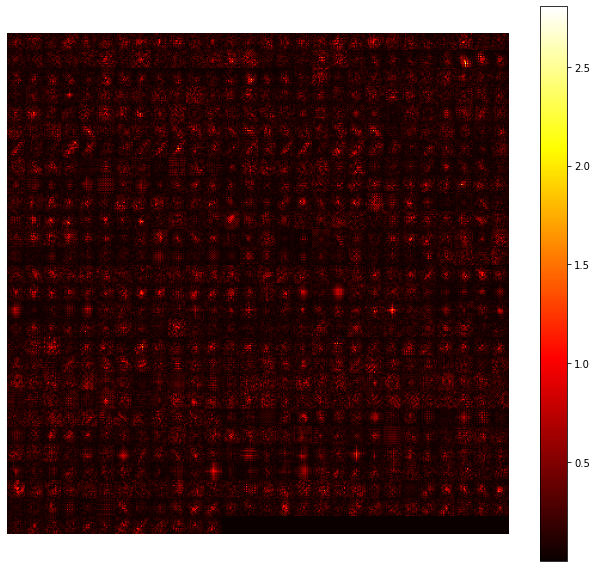

In [42]:
plot_conv_weights(autoencoder.decoder.deconv[-2].conv.weight)

(384, 19, 19)


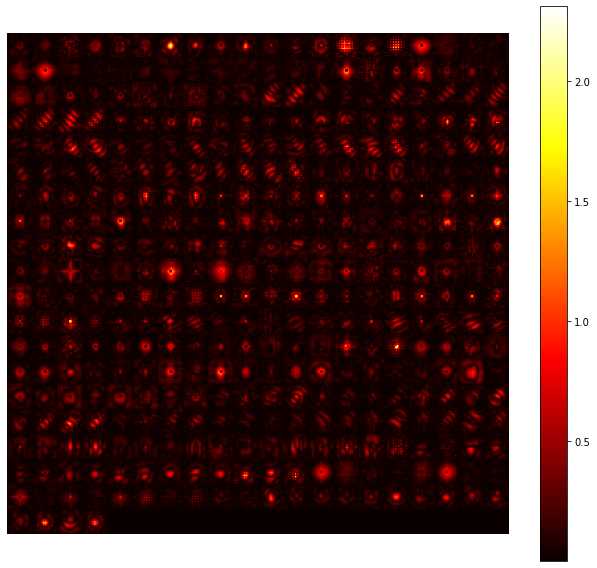

In [43]:
plot_conv_weights(autoencoder.decoder.deconv[-1].conv.weight)

In [44]:
def latent_interpolation2d(data, ninterp=6):
    fig = plt.figure(figsize=(9, 10.95))
    axs = []

    imgs = data[:4]
    latent = autoencoder.encoder(imgs)
    
    def interp(row, col):
        first, second, third, fourth = latent
        row_frac = row / float(ninterp - 1)
        col_frac = col / float(ninterp - 1)
        return (
            row_frac * (col_frac * first + (1.0 - col_frac) * second) +
            (1.0 - row_frac) * (col_frac * third + (1.0 - col_frac) * fourth)
        )[None, ...]
    
    for row in range(ninterp):
        for col in range(ninterp):
            interp_latent = interp(row, col)
            decoded = th.sigmoid(autoencoder.decoder(interp_latent)).detach()
            np_decoded = decoded.squeeze(0).permute(1, 2, 0).numpy()
            
            ax = fig.add_subplot(ninterp, ninterp, row*ninterp + col + 1)
            ax.imshow(np_decoded)
            ax.axis('off')
            axs.append(ax)

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)

In [45]:
a, b, c, d = (
    'CelebA/Img/img_align_celeba/007276.jpg',
    'CelebA/Img/img_align_celeba/107930.jpg',
    'CelebA/Img/img_align_celeba/139240.jpg',
    'CelebA/Img/img_align_celeba/153317.jpg'
)

In [46]:
e, f, g, h = (
    'CelebA/Img/img_align_celeba/132430.jpg',
    'CelebA/Img/img_align_celeba/011096.jpg',
    'CelebA/Img/img_align_celeba/198497.jpg',
    'CelebA/Img/img_align_celeba/162033.jpg'
)

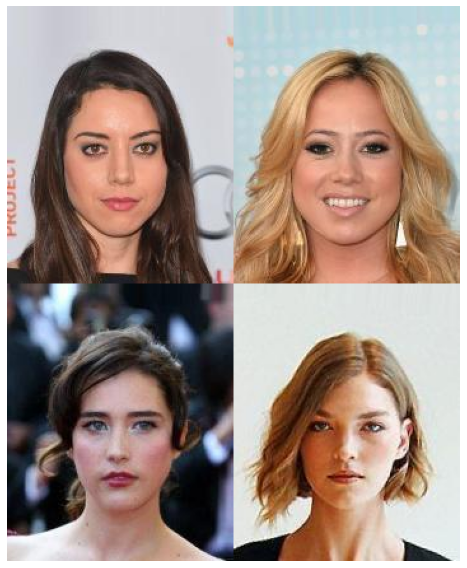

In [47]:
picked_data = ImageDataset((f, a, d, h))
picked_data.plot_montage(4)

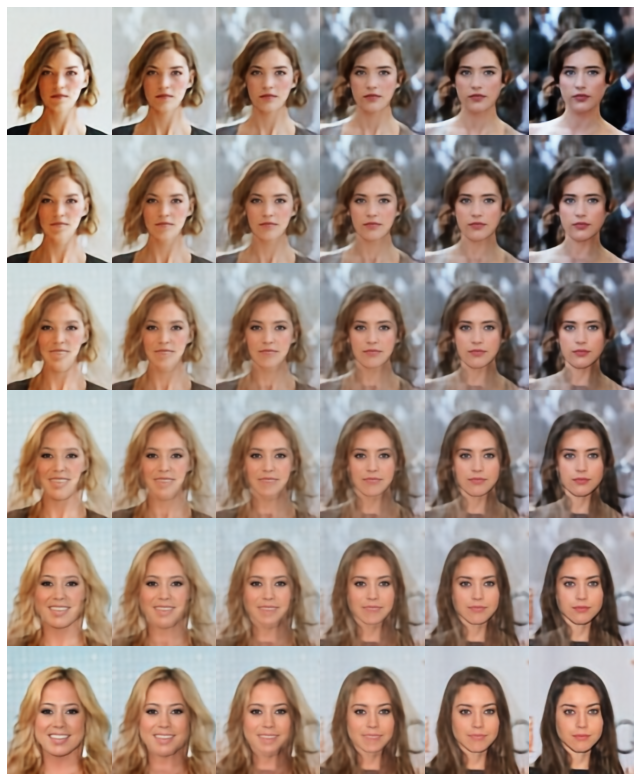

In [48]:
latent_interpolation2d(picked_data)

In [49]:
picked_data = ImageDataset((
    'CelebA/Img/img_align_celeba/161387.jpg',
    'CelebA/Img/img_align_celeba/188697.jpg',
    'CelebA/Img/img_align_celeba/024214.jpg',
    'CelebA/Img/img_align_celeba/200445.jpg',
))

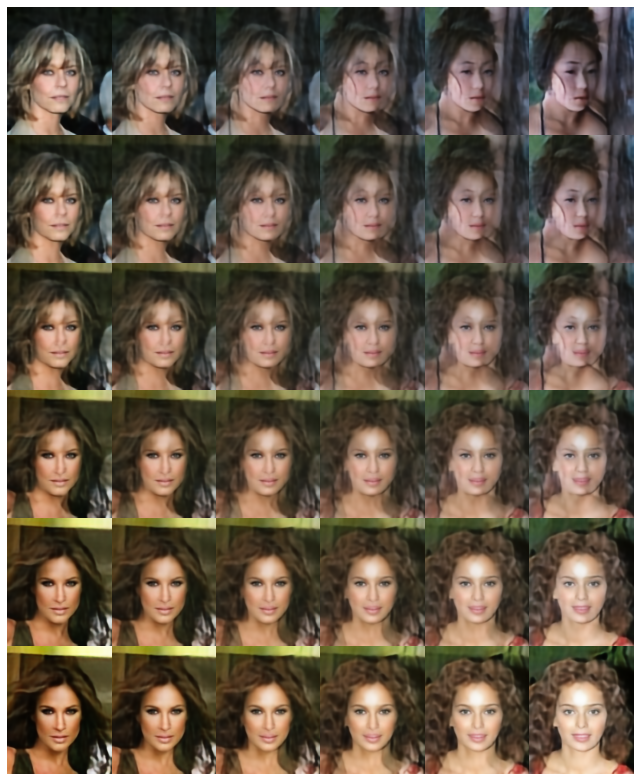

In [50]:
latent_interpolation2d(picked_data)

In [51]:
picked_data = ImageDataset((
    'CelebA/Img/img_align_celeba/090369.jpg',
    'CelebA/Img/img_align_celeba/017815.jpg',
    'CelebA/Img/img_align_celeba/029884.jpg',
    'CelebA/Img/img_align_celeba/154728.jpg',
))

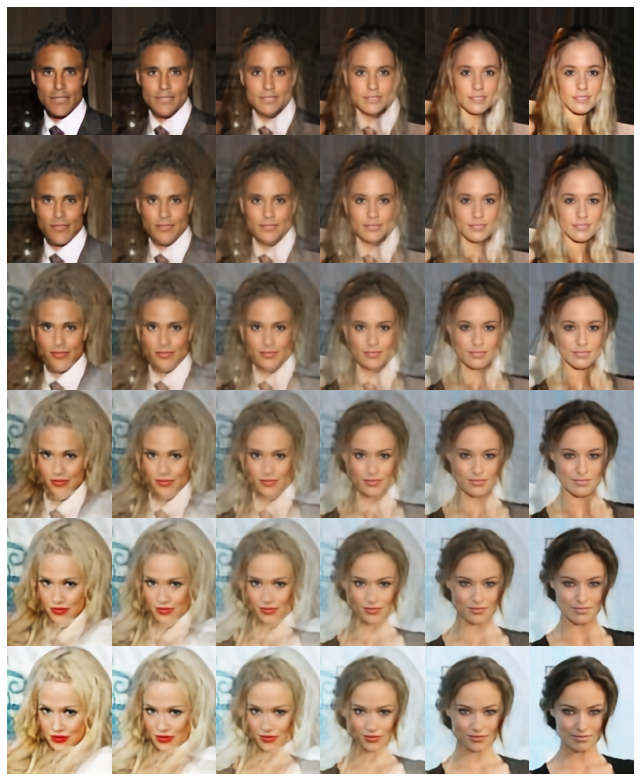

In [52]:
latent_interpolation2d(picked_data)